In [1]:
!pip install --upgrade pip

^C


The chosen article is: <b>Integration of spatial transcriptomic and single cell sequencing identifies expression patterns underlying immune and epithelial cell cross-talk in acute kidney injury</b> </br>
DOI: https://pubmed.ncbi.nlm.nih.gov/34003797/

The accession number on the acession viewer website (https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi) leads us to a several files, one of them is GSE171406_Human_Nephrectomy.tar.gz which is the one we need. Extracting this file gives us the Visium data structure which is the best desired structure for ST data (at least for working with ST-Learn).


- filtered_feature_bc_matrix.h5: this file is a compressed format to store the single-cell data. This contains no spatial information, but rather the count information per barcode and index. (see https://support.10xgenomics.com/single-cell-gene-expression/software/pipelines/latest/advanced/h5_matrices) for more.
- spatial/...
    - This folder contains all the spatial information, namely the base images, quality control images, some metadata, and the actual .csv file with the spatial information per barcode. (more info here: https://support.10xgenomics.com/spatial-gene-expression/software/pipelines/latest/output/images)
   
    

Note: StLearn also supports explicity building the input data, incase we have some old data to use (https://stlearn.readthedocs.io/en/latest/tutorials/Read_any_data.html) but if we'll only use Visium things should be easy.

In [3]:
!pip install scikit-learn stlearn opencv-python torch tqdm

  Using cached stlearn-0.4.7-py2.py3-none-any.whl (415 kB)
  Using cached bokeh-2.4.2-py3-none-any.whl (18.5 MB)
  Using cached click-8.1.2-py3-none-any.whl (96 kB)
  Using cached scikit_image-0.19.2-cp39-cp39-win_amd64.whl (12.6 MB)
  Using cached tensorflow-2.8.0-cp39-cp39-win_amd64.whl (438.0 MB)
  Using cached louvain-0.7.1-cp39-cp39-win_amd64.whl (94 kB)
  Using cached leidenalg-0.8.9-cp39-cp39-win_amd64.whl (108 kB)
  Using cached scanpy-1.9.1-py3-none-any.whl (2.0 MB)


ERROR: Could not install packages due to an OSError: [Errno 2] No such file or directory: 'c:\\users\\itay\\anaconda3\\lib\\site-packages\\tqdm-4.62.3.dist-info\\METADATA'

ERROR: Could not install packages due to an OSError: [WinError 32] The process cannot access the file because it is being used by another process: 'C:\\Users\\Itay\\anaconda3\\Lib\\site-packages\\tensorflow\\python\\_pywrap_tensorflow_internal.pyd'
Consider using the `--user` option or check the permissions.



  Using cached stlearn-0.4.7-py2.py3-none-any.whl (415 kB)
  Using cached tensorflow-2.8.0-cp39-cp39-win_amd64.whl (438.0 MB)
  Using cached keras-2.8.0-py2.py3-none-any.whl (1.4 MB)
  Using cached louvain-0.7.1-cp39-cp39-win_amd64.whl (94 kB)
  Using cached Pillow-9.1.0-cp39-cp39-win_amd64.whl (3.3 MB)
  Using cached leidenalg-0.8.9-cp39-cp39-win_amd64.whl (108 kB)
  Using cached scikit_image-0.19.2-cp39-cp39-win_amd64.whl (12.6 MB)
  Using cached scanpy-1.9.1-py3-none-any.whl (2.0 MB)
  Using cached bokeh-2.4.2-py3-none-any.whl (18.5 MB)
  Using cached numpy-1.21.5-cp39-cp39-win_amd64.whl (14.0 MB)
  Using cached click-8.1.2-py3-none-any.whl (96 kB)
  Using cached libclang-13.0.0-py2.py3-none-win_amd64.whl (13.9 MB)
  Using cached termcolor-1.1.0-py3-none-any.whl
  Using cached gast-0.5.3-py3-none-any.whl (19 kB)
  Using cached tensorboard-2.8.0-py3-none-any.whl (5.8 MB)
  Using cached Keras_Preprocessing-1.1.2-py2.py3-none-any.whl (42 kB)
  Using cached opt_einsum-3.3.0-py3-none-any

['spatial']
----
spatial/
['aligned_fiducials.jpg', 'detected_tissue_image.jpg', 'scalefactors_json.json', 'tissue_hires_image.png', 'tissue_lowres_image.png', 'tissue_positions_list.csv']
-------
images in dir:


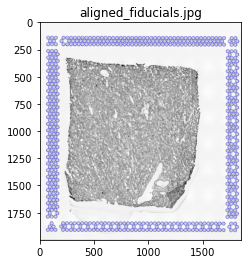

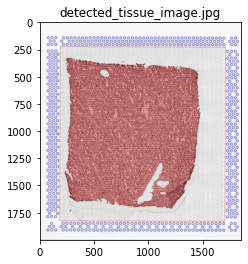

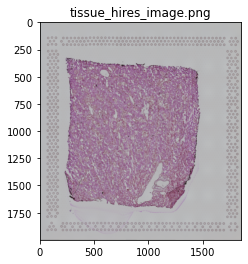

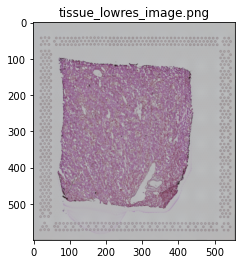

tissue_positions_list.csv
                    0  1  2  3     4     5
0  ACGCCTGACACGCGCT-1  0  0  0  1369  1132
1  TACCGATCCAACACTT-1  0  1  1  1484  1198
2  ATTAAAGCGGACGAGC-1  0  0  2  1369  1264
3  GATAAGGGACGATTAG-1  0  1  3  1484  1330
4  GTGCAAATCACCAATA-1  0  0  4  1370  1396


In [1]:
import os
import cv2
import matplotlib.pyplot as plt
import pandas as pd
print(os.listdir('data/GSE171406_Human_Nephrectomy')[1:])
print('----')
print('spatial/')
spatial_dir = 'data/GSE171406_Human_Nephrectomy/spatial'
print(os.listdir(spatial_dir))

print('-------')

print('images in dir:')
for img in [k for k in os.listdir(spatial_dir) if k.endswith('.jpg') or k.endswith('.png')]:
    plt.title(img)
    plt.imshow(cv2.imread(os.path.join(spatial_dir, img)))
    plt.show()
    
print('tissue_positions_list.csv')
print(pd.read_csv(os.path.join(spatial_dir, 'tissue_positions_list.csv'), header=None).head(5))

In [2]:
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

In [3]:
import stlearn as st
import numpy as np
from pathlib import Path
st.settings.set_figure_params(dpi=180)

DATASET_NAME = 'GSE171406_Human_Nephrectomy'

# Defining paths
BASE_PATH = Path(f'data/{DATASET_NAME}')

# Temporary path for tile storage
TILE_PATH = Path("tmp/tiles")
TILE_PATH.mkdir(parents=True, exist_ok=True)

# output path
OUT_PATH = Path(f"out/{DATASET_NAME}")
OUT_PATH.mkdir(parents=True, exist_ok=True)

In [4]:
data = st.Read10X(BASE_PATH)
data

C:\Users\Itay\anaconda3\lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


AnnData object with n_obs × n_vars = 3007 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'imagecol', 'imagerow'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

Data is an annotated sparse matrix of observations x variables.

In [5]:
X = data.X.toarray()

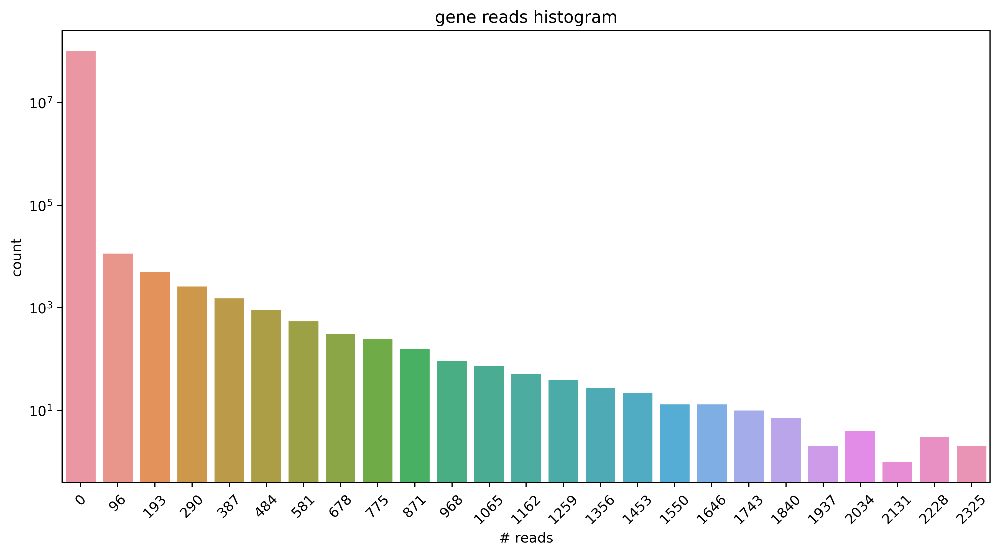

In [6]:
import seaborn as sns
bin_count, bin_val = np.histogram(X, bins=25)
plt.figure(figsize=(12, 6))
plt.title('gene reads histogram')
plt.ylabel('count')
plt.xlabel('# reads')
sns.barplot(x=bin_val[:-1].astype(int), y=bin_count)
plt.yscale('log')
plt.xticks(rotation = 45)
plt.show()

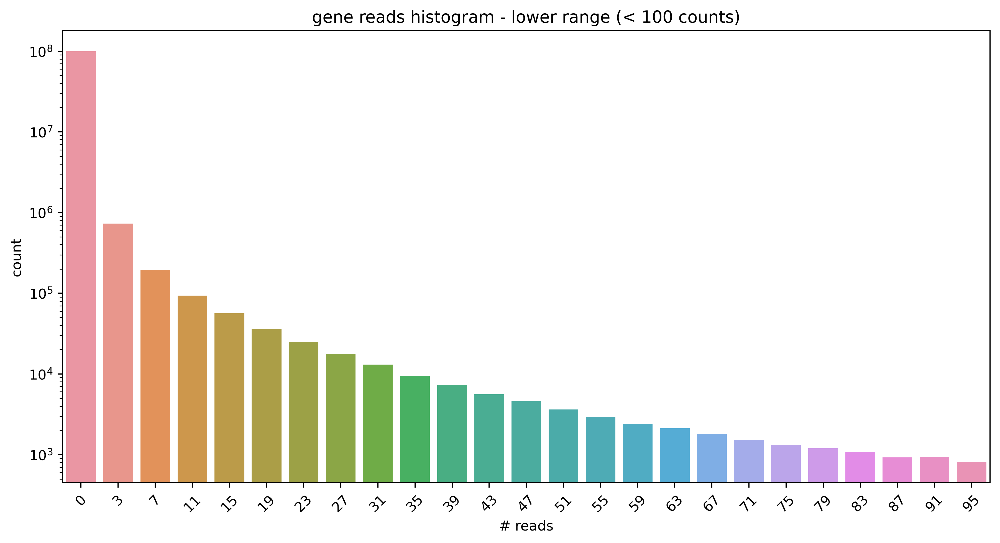

In [7]:
bin_count, bin_val = np.histogram(X[X < 100], bins=25)
plt.figure(figsize=(12, 6))
plt.title('gene reads histogram - lower range (< 100 counts)')
plt.ylabel('count')
plt.xlabel('# reads')
sns.barplot(x=bin_val[:-1].astype(int), y=bin_count)
plt.yscale('log')
plt.xticks(rotation = 45)
plt.show()

In [8]:
bin_count, bin_val = np.histogram(X[(X < 100) & (X > 0)], bins=25)

# The final bin will include the entire range, adding it
bin_count = np.hstack([bin_count, np.zeros(2)])
bin_val = np.hstack([bin_val, np.ones(1) * np.inf])
bin2dropoff = (bin_count / bin_count.sum())

X_flat = X.flatten()
dropoff_flat = bin2dropoff[(np.digitize(X, bins=bin_val))].flatten()
all_indices = np.arange(X_flat.shape[0])
nonzero_indices = np.where(X_flat)[0]

In [9]:
DESIRED_DROPOFF_RATIO = 0.1

dropped_indices = np.random.choice(nonzero_indices, 
                                   size=int(nonzero_indices.shape[0] * DESIRED_DROPOFF_RATIO),
                                   replace=False)
#                                    p=dropoff_flat[nonzero_indices] / dropoff_flat[nonzero_indices].sum())
print(f'dropped nonzero indices: {dropped_indices.shape[0]}')
print(f'drop ratio (nonzero): {dropped_indices.shape[0] / nonzero_indices.shape[0]:.2f}')
print(f'drop ratio (original): {dropped_indices.shape[0] / X_flat.shape[0]:.2f}')


X_dropped = X.copy()
X_dropped[np.unravel_index(dropped_indices, X.shape)] = 0
X_dropped

print(f'Non zero values - original n {(X > 0).sum()}, post-drop n {(X_dropped > 0).sum()}')

dropped nonzero indices: 926101
drop ratio (nonzero): 0.10
drop ratio (original): 0.01
Non zero values - original n 9261014, post-drop n 8334913


In [10]:
col_idx = np.tile(np.arange(X.shape[1]), (X.shape[0]))
row_idx = np.repeat(np.arange(X.shape[0]), (X.shape[1]))
vals = X.flatten()


# print(col_idx.shape, row_idx.shape, vals.shape)
pair_array = np.vstack((col_idx, row_idx, vals)).T


test_idx = 100848733
print(col_idx[test_idx])
print(row_idx[test_idx])
print(pair_array[test_idx])
print(X[row_idx[test_idx], col_idx[test_idx]])

33505
3006
[33505.  3006.   116.]
116.0


In [11]:
from sklearn.model_selection import train_test_split
# Train-test splitting the pair array based on dropped indices
train_indices = all_indices[~np.isin(all_indices, dropped_indices)]
validation_indices, test_indices = train_test_split(dropped_indices, train_size=0.1)

# train_indices, validation_indices = train_test_split(train_indices, train_size=0.9)
# print(train_indices.shape, validation_indices.shape, test_indices.shape)

assert train_indices.shape[0] + validation_indices.shape[0] + test_indices.shape[0] == X_flat.shape[0]

In [12]:
import torch
from torch.utils.data import TensorDataset
import os
BATCH_SIZE = 8192
NUM_WORKERS = 6
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
train_array = pair_array[train_indices]
train_dataloader = torch.utils.data.DataLoader(TensorDataset(torch.Tensor(train_array[train_array[:, 2] > 0]).to(dtype=torch.int)), num_workers=NUM_WORKERS, batch_size=BATCH_SIZE, pin_memory=True, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(TensorDataset(torch.Tensor(pair_array[validation_indices]).to(dtype=torch.int)), num_workers=NUM_WORKERS, batch_size=BATCH_SIZE, pin_memory=True, shuffle=True)
# test_dataloader = torch.utils.data.DataLoader(TensorDataset(pair_array[test_indices]), pin_memory=True,
#                                                num_workers=0, batch_size=BATCH_SIZE)

In [15]:
positions = torch.Tensor(data.obs[['array_row', 'array_col']].values)
spots_pdist = torch.cdist(positions, positions)
spots_pdist = (spots_pdist - spots_pdist.min()) / (spots_pdist.max() - spots_pdist.min())

In [17]:
print('running on device: ', device)
EMBEDDING_DIM = 512
N_EPOCHS = 20
n_genes = data.n_vars
n_spots = data.n_obs


gmf_model = GMF(n_genes, n_spots, spots_pdist, device, EMBEDDING_DIM, dist_reg_factor=0)
gmf_trainer = GMFTrainer(train_dataloader, val_dataloader, gmf_model, device, n_epochs=N_EPOCHS)
train_hist, validation_hist, train_rmse_hist, validation_rmse_hist = gmf_trainer.train()

running on device:  cuda


Validation: 100%|█████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:01<00:00, 11.74it/s, Loss=7.41, rmse=2.7218]


In [19]:
def plot_rmse_history(train_rmse_hist, validation_rmse_hist):
    plt.figure(figsize=(8, 3))
    plt.title('RMSE by epoch')
    plt.xlabel('Epoch')
    plt.ylabel('RMSE')
    plt.plot(np.arange(len(train_rmse_hist)), train_rmse_hist, label='train RMSE')
    plt.plot(np.arange(len(validation_rmse_hist)), validation_rmse_hist, label='validation RMSE')
    plt.legend()
    plt.show()

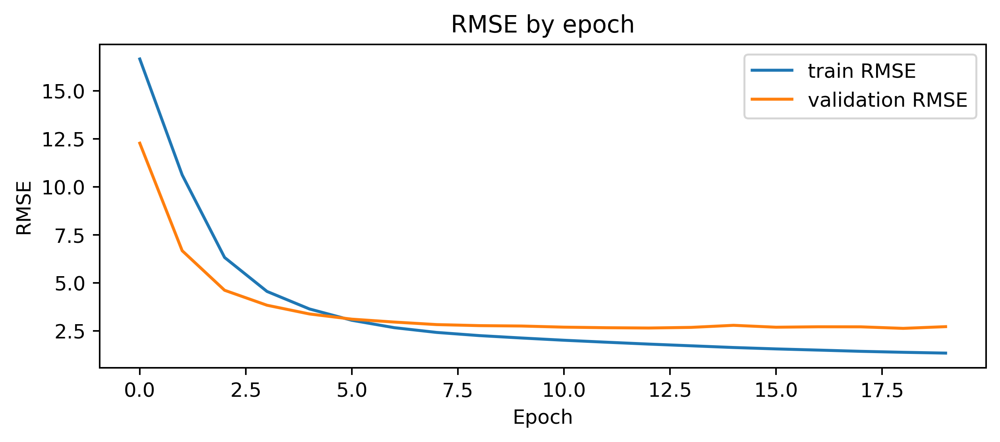

In [20]:
plot_rmse_history(train_rmse_hist, validation_rmse_hist)

In [18]:
print('running on device: ', device)
EMBEDDING_DIM = 512
N_EPOCHS = 20
n_genes = data.n_vars
n_spots = data.n_obs


gmf_model_with_reg = GMF(n_genes, n_spots, spots_pdist, device, EMBEDDING_DIM, dist_reg_factor=0.01)
gmf_trainer_with_reg = GMFTrainer(train_dataloader, val_dataloader, gmf_model_with_reg, device, n_epochs=N_EPOCHS)
train_hist_with_reg, validation_hist_with_reg, train_rmse_hist_with_reg, validation_rmse_hist_with_reg = gmf_trainer_with_reg.train()

running on device:  cuda


Validation: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:01<00:00, 11.54it/s, Loss=9.84, rmse=3.02015]


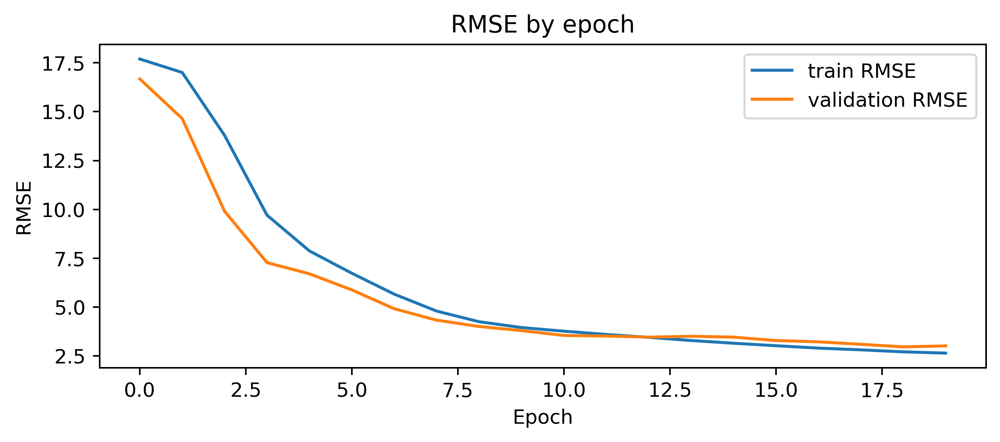

In [22]:
plot_rmse_history(train_rmse_hist_with_reg, validation_rmse_hist_with_reg)

In [192]:
import scipy
scipy.spatial.distance.squareform(embedding_pdist.cpu().detach().numpy())

array([[0.        , 0.45546243, 0.5184636 , ..., 0.46548072, 0.4505508 ,
        0.46942723],
       [0.45546243, 0.        , 0.5286606 , ..., 0.5199302 , 0.41851613,
        0.36089277],
       [0.5184636 , 0.5286606 , 0.        , ..., 0.33594048, 0.5485219 ,
        0.46744403],
       ...,
       [0.46548072, 0.5199302 , 0.33594048, ..., 0.        , 0.43790194,
        0.45377183],
       [0.4505508 , 0.41851613, 0.5485219 , ..., 0.43790194, 0.        ,
        0.5125011 ],
       [0.46942723, 0.36089277, 0.46744403, ..., 0.45377183, 0.5125011 ,
        0.        ]], dtype=float32)

In [27]:
test_dataloader = torch.utils.data.DataLoader(TensorDataset(torch.Tensor(pair_array[test_indices]).to(dtype=torch.int)), 
                                             pin_memory=True, num_workers=4, batch_size=BATCH_SIZE, shuffle=True)
evaluation_df = GMFEvaluator().evaluate(gmf_model, test_dataloader, 'cpu')
evaluation_df['error'] = evaluation_df['pred_count'] - evaluation_df['count']
evaluation_df['abs_error'] = np.abs(evaluation_df['error'])
print('mean absolute error, no regularization: ', evaluation_df['abs_error'].mean())

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 102/102 [00:01<00:00, 66.19it/s]

mean absolute error:  1.1589517868457369


In [29]:
test_dataloader = torch.utils.data.DataLoader(TensorDataset(torch.Tensor(pair_array[test_indices]).to(dtype=torch.int)), 
                                             pin_memory=True, num_workers=4, batch_size=BATCH_SIZE, shuffle=True)
evaluation_df = GMFEvaluator().evaluate(gmf_model_with_reg, test_dataloader, 'cpu')
evaluation_df['error'] = evaluation_df['pred_count'] - evaluation_df['count']
evaluation_df['abs_error'] = np.abs(evaluation_df['error'])
print(f'mean absolute error, (reg = {gmf_model_with_reg.dist_reg_factor}): ', evaluation_df['abs_error'].mean())

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 102/102 [00:01<00:00, 68.65it/s]

mean absolute error, (reg = 0.01):  0.9857249828519536


In [50]:
evaluation_df.sort_values(by='abs_error').tail(10)

,gene,spot,count,pred_count,error,abs_error
93474,33502,669,1338,1117.969116,-220.030884,220.030884
400154,25537,812,701,476.317505,-224.682495,224.682495
658586,33498,1982,776,1001.323242,225.323242,225.323242
546599,4026,1028,246,18.074017,-227.925983,227.925983
674612,33498,33,917,1156.255127,239.255127,239.255127
578807,33499,669,1109,856.887573,-252.112427,252.112427
655897,25537,2336,722,432.340607,-289.659393,289.659393
29544,2619,1467,352,38.592213,-313.407787,313.407787
319429,33498,134,2244,1917.719360,-326.280640,326.280640
621900,2619,2686,895,17.519535,-877.480465,877.480465


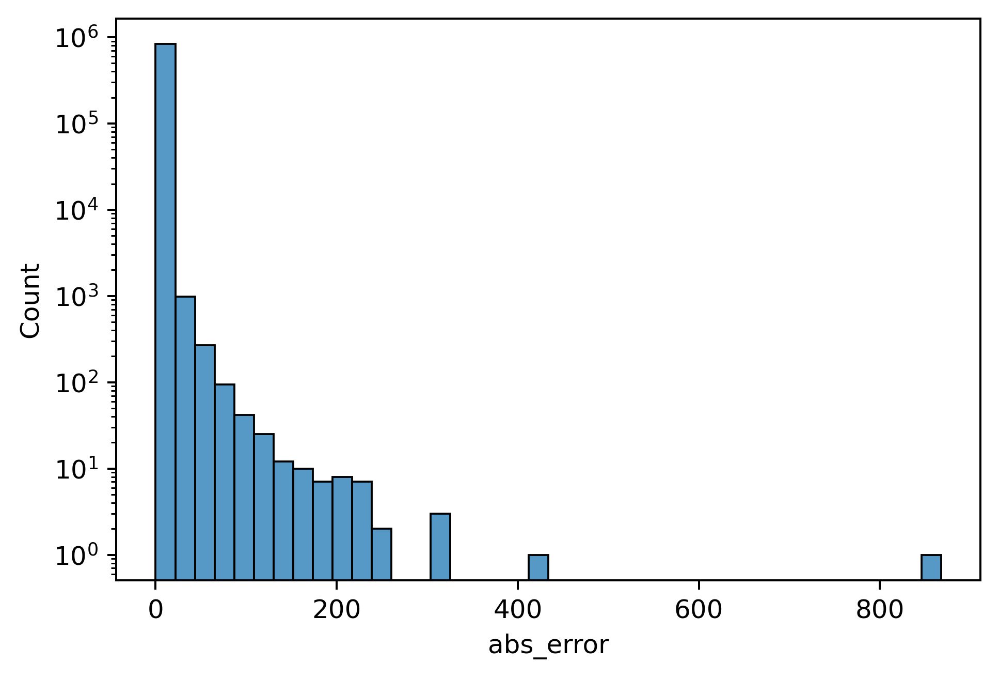

In [42]:
sns.histplot(evaluation_df['abs_error'], kde=False, bins=40)
plt.yscale('log')
plt.show()

In [43]:
evaluation_df.sort_values(by='abs_error').tail(20)

,gene,spot,count,pred_count,error,abs_error
161552,25537,1940,6,210.122971,204.122971,204.122971
241687,25537,1313,472,267.535736,-204.464264,204.464264
753475,20428,1785,271,63.615265,-207.384735,207.384735
483907,7834,2006,254,45.991158,-208.008842,208.008842
489441,4026,678,212,1.993571,-210.006429,210.006429
322752,25537,2346,455,244.563675,-210.436325,210.436325
584362,7834,2032,305,84.806648,-220.193352,220.193352
465630,25537,1955,6,228.695023,222.695023,222.695023
38724,9829,1874,360,134.941116,-225.058884,225.058884
627466,25537,2170,3,228.877014,225.877014,225.877014


In [9]:
subset = data[:500, :500].X.toarray()
print(subset.max(), np.unravel_index(np.argmax(subset), subset.shape))

129.0 (363, 493)


In [13]:
import scipy
scipy.sparse.csr_matrix()

TypeError: __init__() missing 1 required positional argument: 'arg1'

In [11]:
X = data.X
dropout_probability = scipy.sparse.csr_matrix()
data.X.nonzero()

(array([   0,    0,    0, ..., 3006, 3006, 3006], dtype=int32),
 array([33508, 33507, 33506, ...,    34,    29,    27], dtype=int32))

In [12]:
print('Observation data: ')
print(data.obs.iloc[363])

print('------')

print('Gene data:')
print(data.var.iloc[493])

Observation data: 
in_tissue       1.000000
array_row      61.000000
array_col       9.000000
imagecol      303.196655
imagerow     1483.396720
Name: AGAACCCTCAATTGGG-1, dtype: float64
------
Gene data:
gene_ids         ENSG00000142676
feature_types    Gene Expression
genome                    GRCh38
Name: RPL11, dtype: object


In [13]:
# Each observation has its own associated parameters (such as row,col positions)
data.obs

,in_tissue,array_row,array_col,imagecol,imagerow
AAACAAGTATCTCCCA-1,1,50,102,1390.772975,1261.843556
AAACACCAATAACTGC-1,1,59,19,420.083216,1443.017726
AAACAGAGCGACTCCT-1,1,14,94,1298.680533,529.354441
AAACAGCTTTCAGAAG-1,1,43,9,303.905059,1117.329263
AAACAGGGTCTATATT-1,1,47,13,350.482582,1198.795654
...,...,...,...,...,...
TTGTTCAGTGTGCTAC-1,1,24,64,947.666648,732.134914
TTGTTGTGTGTCAAGA-1,1,31,77,1099.264976,874.878199
TTGTTTCACATCCAGG-1,1,58,42,689.099407,1423.182431
TTGTTTCATTAGTCTA-1,1,60,30,548.658433,1463.561424


In [14]:
# Each variable (gene) has its own associated parameters
data.var

,gene_ids,feature_types,genome
MIR1302-2HG,ENSG00000243485,Gene Expression,GRCh38
FAM138A,ENSG00000237613,Gene Expression,GRCh38
OR4F5,ENSG00000186092,Gene Expression,GRCh38
AL627309.1,ENSG00000238009,Gene Expression,GRCh38
AL627309.3,ENSG00000239945,Gene Expression,GRCh38
...,...,...,...
AC233755.2,ENSG00000277856,Gene Expression,GRCh38
AC233755.1,ENSG00000275063,Gene Expression,GRCh38
AC240274.1,ENSG00000271254,Gene Expression,GRCh38
AC213203.1,ENSG00000277475,Gene Expression,GRCh38


Now that we understand the data - lets see the stLearn magic.

In [23]:
print(data.var.index.tolist())

['MIR1302-2HG', 'FAM138A', 'OR4F5', 'AL627309.1', 'AL627309.3', 'AL627309.2', 'AL627309.4', 'AL732372.1', 'OR4F29', 'AC114498.1', 'OR4F16', 'AL669831.2', 'AL669831.5', 'FAM87B', 'LINC00115', 'FAM41C', 'AL645608.7', 'AL645608.3', 'AL645608.5', 'AL645608.1', 'SAMD11', 'NOC2L', 'KLHL17', 'PLEKHN1', 'PERM1', 'AL645608.8', 'HES4', 'ISG15', 'AL645608.2', 'AGRN', 'AL645608.9', 'RNF223', 'C1orf159', 'LINC01342', 'AL390719.2', 'TTLL10-AS1', 'TTLL10', 'TNFRSF18', 'TNFRSF4', 'SDF4', 'B3GALT6', 'C1QTNF12', 'AL162741.1', 'UBE2J2', 'LINC01786', 'SCNN1D', 'ACAP3', 'PUSL1', 'INTS11', 'CPTP', 'TAS1R3', 'DVL1', 'MXRA8', 'AURKAIP1', 'CCNL2', 'MRPL20', 'AL391244.3', 'ANKRD65', 'AL391244.2', 'TMEM88B', 'LINC01770', 'VWA1', 'ATAD3C', 'ATAD3B', 'ATAD3A', 'TMEM240', 'SSU72', 'AL645728.1', 'FNDC10', 'AL691432.2', 'MIB2', 'MMP23B', 'CDK11B', 'FO704657.1', 'SLC35E2B', 'CDK11A', 'SLC35E2A', 'NADK', 'GNB1', 'AL109917.1', 'CALML6', 'TMEM52', 'CFAP74', 'AL391845.2', 'GABRD', 'AL391845.1', 'PRKCZ', 'AL590822.2', 'PRK

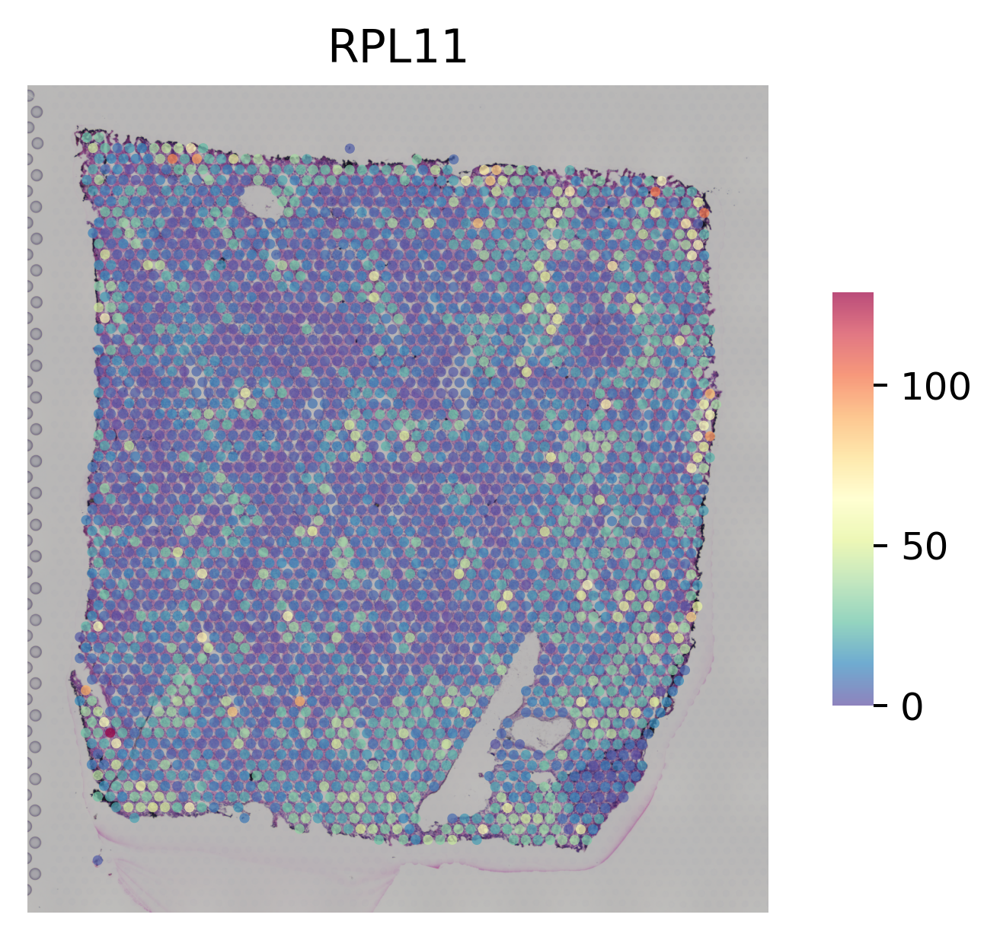

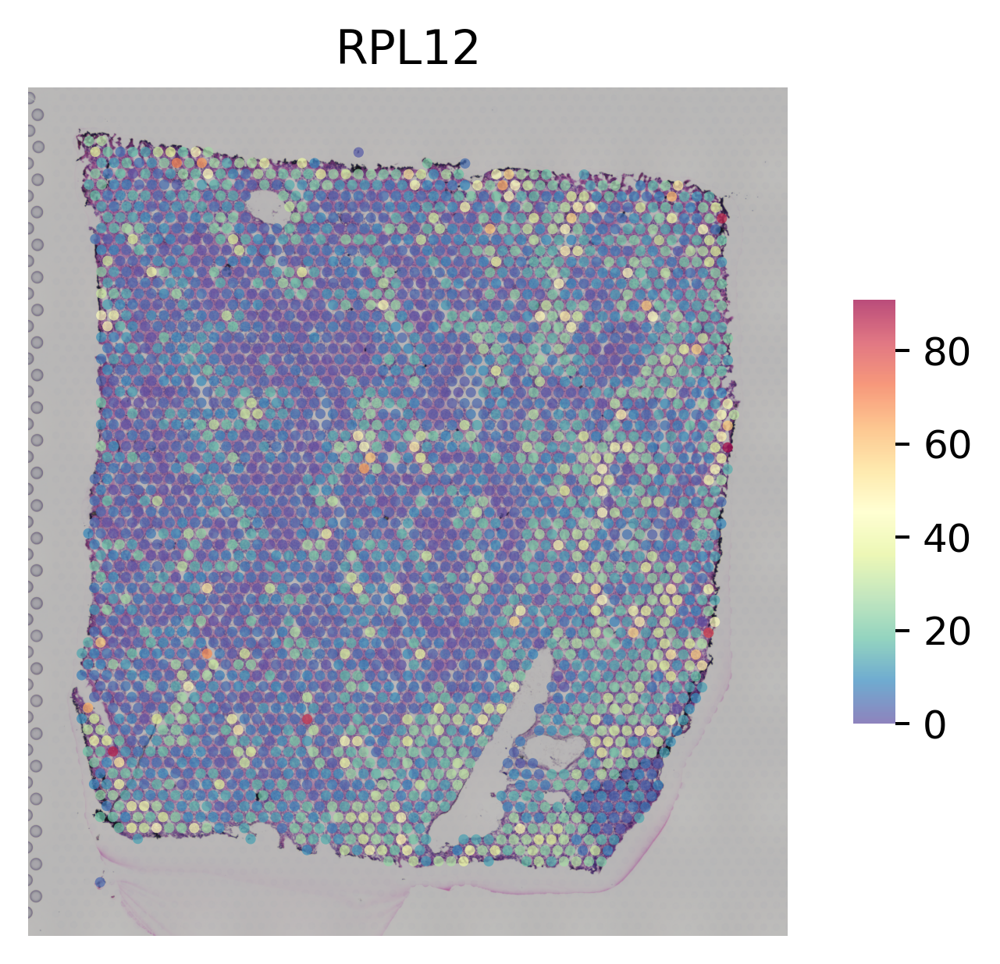

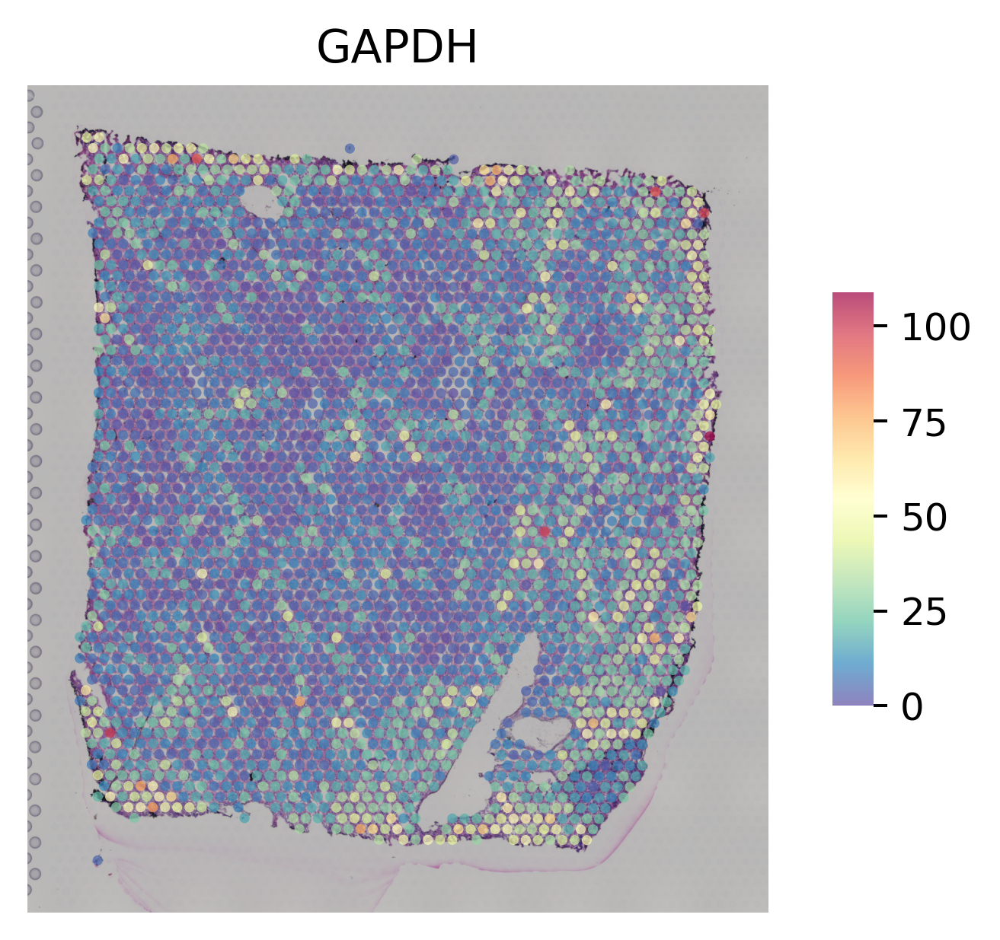

In [25]:
CHOSEN_GENES = ['RPL11', 'RPL12', 'GAPDH']
for gene in CHOSEN_GENES:
    st.pl.gene_plot(data, gene_symbols=gene)

In [163]:
# Allows filtering genes either by minimum number of cells or general counts
st.pp.filter_genes(data,min_cells=1)

data

AnnData object with n_obs × n_vars = 3007 × 21721
    obs: 'in_tissue', 'array_row', 'array_col', 'imagecol', 'imagerow'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'

We are now down to only genes that are expressed in at least one cell. Lets go even stricter

In [164]:
# Allows filtering genes either by minimum number of cells or general counts
st.pp.filter_genes(data,min_cells=20)

data

AnnData object with n_obs × n_vars = 3007 × 15433
    obs: 'in_tissue', 'array_row', 'array_col', 'imagecol', 'imagerow'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells'
    uns: 'spatial'
    obsm: 'spatial'

~15k genes that appear in atleast 20 cells

In [165]:
# This normalizes counts from each cell by the total count of genes in the cell
st.pp.normalize_total(data)

# applying log to the data matrix (why?)
st.pp.log1p(data)

Normalization step is finished in adata.X
Log transformation step is finished in adata.X


In [166]:
# This creates the tile images and associates each observation to a tile
st.pp.tiling(data, TILE_PATH)

Tiling image: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ [ time left: 00:00 ]


We'll now see that each `obs` in data has another attribute, tile_path

In [37]:
data.obs

,in_tissue,array_row,array_col,imagecol,imagerow,tile_path
AAACAAGTATCTCCCA-1,1,50,102,1390.772975,1261.843556,tmp/tiles/1390.77297505-1261.8435562500001-40....
AAACACCAATAACTGC-1,1,59,19,420.083216,1443.017726,tmp/tiles/420.08321620000004-1443.0177258-40.jpeg
AAACAGAGCGACTCCT-1,1,14,94,1298.680533,529.354441,tmp/tiles/1298.6805330500001-529.35444065-40.jpeg
AAACAGCTTTCAGAAG-1,1,43,9,303.905059,1117.329263,tmp/tiles/303.9050586-1117.32926265-40.jpeg
AAACAGGGTCTATATT-1,1,47,13,350.482582,1198.795654,tmp/tiles/350.48258215-1198.79565365-40.jpeg
...,...,...,...,...,...,...
TTGTTCAGTGTGCTAC-1,1,24,64,947.666648,732.134914,tmp/tiles/947.6666483500001-732.1349139-40.jpeg
TTGTTGTGTGTCAAGA-1,1,31,77,1099.264976,874.878199,tmp/tiles/1099.26497595-874.878199-40.jpeg
TTGTTTCACATCCAGG-1,1,58,42,689.099407,1423.182431,tmp/tiles/689.09940735-1423.1824306-40.jpeg
TTGTTTCATTAGTCTA-1,1,60,30,548.658433,1463.561424,tmp/tiles/548.6584333-1463.5614244-40.jpeg


In [167]:
# Uses some pre-trained CNN (resnet50 by default) to extract features from the actual tiles in the image
# The specification on what happens here is nonexistant, my guess is this runs the data through the network,
# taking the last FC layer and applying PCA on it (with the amount of components as specificed)
st.pp.extract_feature(data, n_components=20)

Extract feature:   3%|██████▏                                                                                                                                                                                    [ time left: 02:11 ]/Users/shushi2/FinalProject/venv/lib/python3.7/site-packages/stlearn/image_preprocessing/feature_extractor.py:68: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  feature_df[spot] = features
Extract feature: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ [ time left: 00:00 ]


The morphology feature is added to adata.obsm['X_morphology']!


In [161]:
data.obsm

AxisArrays with keys: spatial

varm and obsm contain additional data about each variable (gene) and observation (spot), specifically data that is array/matrix and doesn't play nicely in a dataframe

In [87]:
print(data.obsm['X_morphology'].shape)
data.obsm['X_morphology']

(3007, 20)


array([[ -1.0048547 ,   1.389616  ,  -2.082671  , ...,   0.8505298 ,
         -1.0673474 ,  -1.0848045 ],
       [ -7.1332035 ,  -2.937699  ,   2.5037847 , ...,   0.93635607,
         -1.5534174 ,   5.243574  ],
       [  0.6810949 ,  -7.6050844 , -11.133799  , ...,  -1.3924284 ,
          0.18652526,  -1.6569343 ],
       ...,
       [ -2.385028  ,  -0.7298136 , -11.90581   , ...,  -3.4913728 ,
         -0.9747656 ,  -0.14326957],
       [ -5.285653  ,   9.432405  ,  -5.1392727 , ...,   0.13638839,
         -1.8900163 ,   0.18013042],
       [ -5.3267765 , -11.412212  ,   6.4933243 , ...,   1.628372  ,
         -1.0763665 ,   1.1095511 ]], dtype=float32)

In [38]:
# Runs PCA on the data (based on sklearn)
st.em.run_pca(data,n_comps=50)

PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']


Having applied PCA to the data, we see a "compressed" version of our matrix in `data.obsm['X_pca']`, where we have all observations (cells) but n_components instead of the full list of genes.

In [95]:
data.obsm['X_pca'].shape
data.obsm['X_pca']

array([[ -0.20348562,   2.7595396 ,  -0.39593643, ...,   0.39769998,
          0.0773905 ,   0.4311771 ],
       [ 11.566177  , -19.543911  ,  -1.2997328 , ...,  -0.4959207 ,
          0.12800765,   0.3618987 ],
       [  0.06846122,  -1.8416651 ,  -3.3521886 , ...,  -0.46272132,
          0.15096055,  -0.2356504 ],
       ...,
       [ -4.9003425 ,   2.1438572 ,   4.2115626 , ...,   0.15656266,
         -0.69469047,  -1.3545716 ],
       [ -6.451133  ,  -0.9002232 ,  -1.8873938 , ...,   0.2028495 ,
         -1.329287  ,   0.912432  ],
       [ -3.4890053 ,   2.4779768 ,  -5.1135654 , ...,   0.12943876,
         -0.47327086,   1.3432345 ]], dtype=float32)

In [101]:
data_SME = data.copy()

# This is some kind of unique normalization + imputation algorithm - hmm?
st.spatial.SME.SME_normalize(data_SME, use_data="raw")

# Replacing the underlying data by the result of the normalized SME
data_SME.X = data_SME.obsm['raw_SME_normalized']

Adjusting data: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ [ time left: 00:00 ]


The data adjusted by SME is added to adata.obsm['raw_SME_normalized']


We see that imputation was indeed implemented as the number of non zero elements grew from ~9M to ~17.5M

In [168]:
?st.spatial.SME.SME_normalize

In [118]:
print('original non zero: ', data.X.nnz)
print('post imputation nonzero', (data_SME.X != 0).sum())

original non zero:  9226216
post imputation nonzero 17444014


<u>From here we are only working with the post SME data</u>

Scale step is finished in adata.X
PCA is done! Generated in adata.obsm['X_pca'], adata.uns['pca'] and adata.varm['PCs']
Applying Kmeans clustering ...


/Users/shushi2/FinalProject/venv/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:788: FutureWarning: 'precompute_distances' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25). It has no effect
  ". It has no effect", FutureWarning)
/Users/shushi2/FinalProject/venv/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:793: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  " removed in 1.0 (renaming of 0.25).", FutureWarning)


Kmeans clustering is done! The labels are stored in adata.obs["kmeans"]


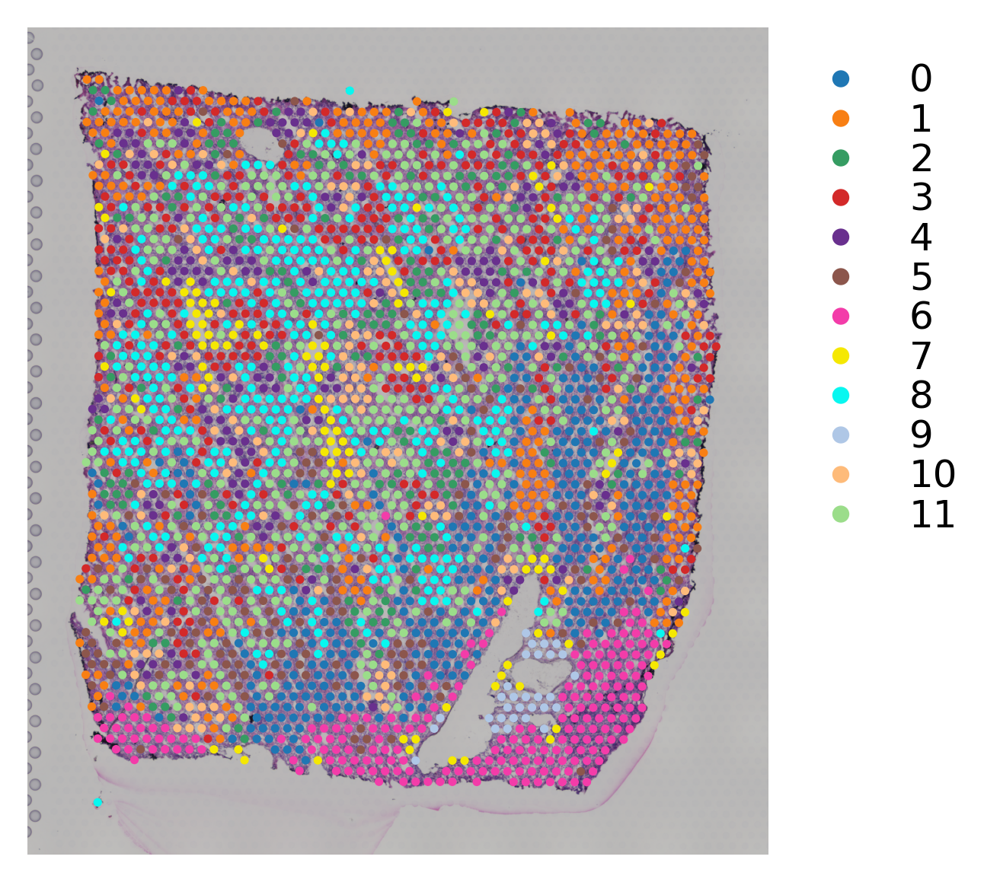

In [119]:
# Scaling data to normalize distribution (unit variance, zero mean)
st.pp.scale(data_SME)

# Running PCA, this time on the SME data
st.em.run_pca(data_SME,n_comps=100)

# Applying K-Means clustering, specifiying which data to use and how to call the output
st.tl.clustering.kmeans(data_SME,n_clusters=12, use_data="X_pca", key_added="X_pca_kmeans")

# Plotting the data with a specified label
st.pl.cluster_plot(data_SME, use_label="X_pca_kmeans")